# Финальный проект. Телеком
Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его сотрудники начнут предлагать промокоды и специальные условия всем, кто планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей, «ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент договор. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и услугах. Задача — обучить на этих данных модель для прогноза оттока клиентов.

Импортируем все необходимые библиотеки, загрузим датасет из PostgreSQL

In [1]:
!pip install ydata-profiling

In [2]:
!pip install --upgrade pip

In [3]:
!pip install --upgrade Pillow

In [4]:
!pip install scikeras

In [5]:
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
from sqlalchemy import create_engine, text
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import  StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from catboost import CatBoostClassifier, Pool
from catboost.utils import get_roc_curve, eval_metric
import plotly.express as px

import phik
from phik.report import plot_correlation_matrix
from phik import report

import torch
import torch.nn as nn
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from scikeras.wrappers import KerasClassifier

## Шаг 1. Загрузите данные

In [6]:
db_config = {
'user': 'praktikum_student',# имя пользователя,
'pwd': 'Sdf4$2;d-d30pp',# пароль,
'host': 'rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net',
'port': 6432,# порт подключения,
'db': 'data-science-final'# название базы данных,
}
 

In [7]:
RANDOM_STATE = 200923

In [8]:
connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(
    db_config['user'],
    db_config['pwd'],
    db_config['host'],
    db_config['port'],
    db_config['db'],
)

In [9]:
engine = create_engine(connection_string) 

In [10]:
tables_to_query = ['contract', 'personal', 'internet', 'phone']

dataframes = {}  # Создаем пустой словарь для хранения данных

with engine.begin() as conn:
    for table in tables_to_query:
        query = text(f'SELECT * FROM telecom.{table}')
        dataframes[table] = pd.read_sql_query(query, conn)

contract = dataframes['contract']
personal = dataframes['personal']
internet = dataframes['internet']
phone = dataframes['phone']

Таблицы загружены, изучим бегло их содержимое.

In [11]:
contract.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,4472-LVYGI,2020-02-01,None,Two year,Yes,Bank transfer (automatic),52.55,NaN
1,3115-CZMZD,2020-02-01,None,Two year,No,Mailed check,20.25,NaN
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15
3,5709-LVOEQ,2020-02-01,None,Two year,No,Mailed check,80.85,NaN
4,9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65


In [12]:
personal.head()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [13]:
internet.head()

,c1,c2,c3,c4,c5,c6,c7,c8
0,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
4,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No


Настоящие названия столбцов съехали в первую строку. Заменим их.

In [14]:
internet.columns = internet.iloc[0]
internet = internet.drop(0)
internet.reset_index(drop=True, inplace=True)
internet.head()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [15]:
phone.head()

,c1,c2
0,customerID,MultipleLines
1,5575-GNVDE,No
2,3668-QPYBK,No
3,9237-HQITU,No
4,9305-CDSKC,Yes


In [16]:
phone.columns = phone.iloc[0]
phone = phone.drop(0)
phone.reset_index(drop=True, inplace=True)
phone.head()

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


Выводы по шагу 1. Все таблицы загружены, названия столбцов поправлены, все таблицы имеют связь друг с другом по столбцу customerID.

## Шаг 2. Исследовательский анализ и предобработка данных

Проведем EDA для каждой из 4 таблиц в отдельности.

In [17]:
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           1869 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7032 non-null   float64
dtypes: float64(2), object(6)
memory usage: 440.3+ KB


In [18]:
contract.duplicated().sum()

0

Есть пропуски в некоторых столбцах, типы данных местами не соответствуют нужным. Дубликатов нет.

In [19]:
contract['BeginDate'] = pd.to_datetime(contract['BeginDate'],format='%Y-%m-%d')

In [20]:
# превратим EndDate в таймстэмп, сохраняя пропуски там, где они были.
contract['EndDate'] = [d.strftime('%Y-%m-%d') if not pd.isnull(d) else '' for d in contract['EndDate']]

In [21]:
contract.head(10)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,4472-LVYGI,2020-02-01,,Two year,Yes,Bank transfer (automatic),52.55,NaN
1,3115-CZMZD,2020-02-01,,Two year,No,Mailed check,20.25,NaN
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15
3,5709-LVOEQ,2020-02-01,,Two year,No,Mailed check,80.85,NaN
4,9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65
5,9305-CDSKC,2018-12-26,2019-11-01,Month-to-month,Yes,Electronic check,99.65,820.50
6,4367-NUYAO,2020-02-01,,Two year,No,Mailed check,25.75,NaN
7,1371-DWPAZ,2020-02-01,,Two year,No,Credit card (automatic),56.05,NaN
8,7892-POOKP,2019-04-27,2019-11-01,Month-to-month,Yes,Electronic check,104.80,3046.05
9,3213-VVOLG,2020-02-01,,Two year,No,Mailed check,25.35,NaN


Что видим из первых 10 строк таблицы contract: 
- данные у нас от 1 февраля 2020 года, поэтому у пользователей, заключивших договор в этот день, в графе TotalCharges NaN: они ещё не успели ничего заплатить. Не будем заполнять эти 11 строк пропусков, поскольку это незначительное количество людей договор не расторгло и вряд ли повлияет на работу моделей.

In [22]:
profile_contract = ProfileReport(contract)
profile_contract

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Изучив ProfileReport по таблице contract, сказать особо нечего, все данные выглядят в порядке. 

In [23]:
personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [24]:
profile_personal = ProfileReport(personal)
profile_personal

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В целом в таблице personal тоже всё хорошо, возможно, надо изменить типы данных, фактически, все столбцы можно считать булевыми и закодировать как 1/0.

In [25]:
phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [26]:
profile_phone = ProfileReport(phone)
profile_phone

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В таблице phone тоже особо нечего комментировать. У 90% клиентов подключен телефон. У примерно половины из них несколько линий. Тип данных в MultipleLines, по сути, тоже булев.

In [27]:
internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [28]:
profile_internet = ProfileReport(internet)
profile_internet

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

И в таблице internet, по сути, во всех столбцах значений максимум по 2. Примерно одинаковые доли клиентов (по 2000-2700 из 5500) имеют дополнительные подключенные услуги, но, судя по таблице корреляций, не одни и те же (разве что у тех, у кого подключено стриминговое ТВ, подключен также и стриминговый каталог фильмов, но и тут коэффициент корреляции меньше 0,5)

Возможно, после объединения таблиц появятся какие-нибудь ещё корреляции.

In [29]:
df = contract.merge(personal, on='customerID', how='left')

In [30]:
df = df.merge(internet, on='customerID', how='left')

In [31]:
df = df.merge(phone, on='customerID', how='left')

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   BeginDate         7043 non-null   datetime64[ns]
 2   EndDate           7043 non-null   object        
 3   Type              7043 non-null   object        
 4   PaperlessBilling  7043 non-null   object        
 5   PaymentMethod     7043 non-null   object        
 6   MonthlyCharges    7043 non-null   float64       
 7   TotalCharges      7032 non-null   float64       
 8   gender            7043 non-null   object        
 9   SeniorCitizen     7043 non-null   int64         
 10  Partner           7043 non-null   object        
 11  Dependents        7043 non-null   object        
 12  InternetService   5517 non-null   object        
 13  OnlineSecurity    5517 non-null   object        
 14  OnlineBackup      5517 n

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Присоединение таблиц корректное! Никакие группы клиентов не удалились

In [33]:
profile_df = ProfileReport(df)
profile_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Из интересных корреляций: 0,8 между MonthlyCharges & InternetService (и полагаю, что речь не про подключение типа DSL), почти 0,5 между месячной абонентской платой и стриминговыми сервисами. Логично предположить, что оптоволоконное подключение и стриминги — самые дорогостоящие услуги. 

Но после объединения стало много пропусков, которые необходимо обработать. Начнём с выделения колонки с целевой переменной (target), чтобы обработать пропуски в EndDate. Если абонент разорвал договор, target = 1, если нет, = 0.

In [34]:
df = df.set_index('customerID')

In [35]:
df.head()

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
customerID,,,,,,,,,,,,,,,,,,,
4472-LVYGI,2020-02-01,,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,NaN
3115-CZMZD,2020-02-01,,Two year,No,Mailed check,20.25,NaN,Male,0,No,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No
3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
5709-LVOEQ,2020-02-01,,Two year,No,Mailed check,80.85,NaN,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No
9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


In [36]:

df['target'] = [1 if i != '' else 0 for i in df['EndDate']]

df.head(20)

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target
customerID,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,2020-02-01,,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,NaN,0
3115-CZMZD,2020-02-01,,Two year,No,Mailed check,20.25,NaN,Male,0,No,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0
3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,1
5709-LVOEQ,2020-02-01,,Two year,No,Mailed check,80.85,NaN,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No,0
9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No,1
9305-CDSKC,2018-12-26,2019-11-01,Month-to-month,Yes,Electronic check,99.65,820.50,Female,0,No,No,Fiber optic,No,No,Yes,No,Yes,Yes,Yes,1
4367-NUYAO,2020-02-01,,Two year,No,Mailed check,25.75,NaN,Male,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,0
1371-DWPAZ,2020-02-01,,Two year,No,Credit card (automatic),56.05,NaN,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,No,NaN,0
7892-POOKP,2019-04-27,2019-11-01,Month-to-month,Yes,Electronic check,104.80,3046.05,Female,0,Yes,No,Fiber optic,No,No,Yes,Yes,Yes,Yes,Yes,1


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b>
    
Целевой признак выбран корректно: целевым действием у нас является уход клиента, поэтому именно его лучше обозначить за positive class, так как от этого зависит интерпретация тех или иных метрик (наиболее используемые метрики, такие как precision, recall, f1, roc-auc, например, по умолчанию фокуcируются на positive оценке, ввиду того, что нам важнее распознать уходящих клиентов, чем оставшихся, то логичнее за positive class обозначить уходящих клиентов). Подробнее <a href = 'https://medium.com/@asimango/the-positive-class-what-should-it-be-in-a-machine-learning-binary-classification-problem-36c316da1127'>тут</a> (открывать через впн).

Теперь заменим пустые значения в EndDate на дату обновления датасета (1 февраля 2020). Это условность, необходимая для избавления от пропусков.

In [37]:
df['EndDate'].unique()

array(['', '2019-12-01', '2019-11-01', '2019-10-01', '2020-01-01'],
      dtype=object)

In [38]:
df.loc[(df['EndDate'] == ''),'EndDate'] = '2020-02-01'

In [39]:
df['EndDate'] = pd.to_datetime(df['EndDate'],format='%Y-%m-%d')

In [40]:
df.head()

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target
customerID,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,NaN,0
3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,Male,0,No,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0
3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,1
5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No,0
9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No,1


Изменим тип данных в столбце SeniorCitizen на категориальный.

In [41]:
df['SeniorCitizen'] = df['SeniorCitizen'].astype('object')

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 4472-LVYGI to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   BeginDate         7043 non-null   datetime64[ns]
 1   EndDate           7043 non-null   datetime64[ns]
 2   Type              7043 non-null   object        
 3   PaperlessBilling  7043 non-null   object        
 4   PaymentMethod     7043 non-null   object        
 5   MonthlyCharges    7043 non-null   float64       
 6   TotalCharges      7032 non-null   float64       
 7   gender            7043 non-null   object        
 8   SeniorCitizen     7043 non-null   object        
 9   Partner           7043 non-null   object        
 10  Dependents        7043 non-null   object        
 11  InternetService   5517 non-null   object        
 12  OnlineSecurity    5517 non-null   object        
 13  OnlineBackup      5517 non-null   object        
 14  DeviceProtecti

Клиентов, подписавших договор в день обновления датасета (1 февраля 2020), удалим из датасета. Их всего 11, а поскольку информации об их поведении в отношениях с компанией нет, эти строки не помогут нам предсказывать вероятность разрыва договора.

In [43]:
# df['TotalCharges'].fillna(df[df['TotalCharges'].isnull()]['MonthlyCharges'], inplace = True)

In [44]:
df = df.dropna(subset=['TotalCharges'])

Пропуски в колонках из датафреймов phone / internet обозначают, что человек не пользуется той или иной услугой. Заполним пропуски соответствующими надписями.

In [45]:
df.fillna('no_service', inplace = True)  # пропуски остались только в столбцах из датафрейма

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 3668-QPYBK to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   BeginDate         7032 non-null   datetime64[ns]
 1   EndDate           7032 non-null   datetime64[ns]
 2   Type              7032 non-null   object        
 3   PaperlessBilling  7032 non-null   object        
 4   PaymentMethod     7032 non-null   object        
 5   MonthlyCharges    7032 non-null   float64       
 6   TotalCharges      7032 non-null   float64       
 7   gender            7032 non-null   object        
 8   SeniorCitizen     7032 non-null   int64         
 9   Partner           7032 non-null   object        
 10  Dependents        7032 non-null   object        
 11  InternetService   7032 non-null   object        
 12  OnlineSecurity    7032 non-null   object        
 13  OnlineBackup      7032 non-null   object        
 14  DeviceProtecti

Обработка пропусков завершена.

Добавим в датафрейм новые столбцы:
1) period, в котором будет отображаться общая длительность (в днях) пользования услугами компании на каждого пользователя;

2) количество оплаченных периодов, для расчета которого суммарную оплату на дату формирования выгрузки разделим на ежемесячный платеж;

3) day_money : прибыль от абонента в день.


In [47]:
df['period'] = (df['EndDate']-df['BeginDate'])/np.timedelta64(1,'D')

In [48]:
df['period_payment']=(df['TotalCharges']/df['MonthlyCharges'])

In [49]:
df['day_money'] = df['TotalCharges']/df['period']

In [50]:
df['period'].describe()

count    7032.000000
mean      297.843857
std        83.104180
min         3.000000
25%       242.000000
50%       298.000000
75%       352.000000
max       583.000000
Name: period, dtype: float64

In [51]:
df['period_payment'].describe()

count    7032.000000
mean       32.424072
std        24.581795
min         1.000000
25%         8.798208
50%        28.831822
75%        55.269025
max        79.341772
Name: period_payment, dtype: float64

In [52]:
df['day_money'].describe()

count    7032.000000
mean        8.768121
std        19.728317
min         0.039468
25%         1.366896
50%         4.872402
75%        13.092996
max      1421.333333
Name: day_money, dtype: float64

In [53]:
threshold = df['day_money'].quantile(0.95)

In [54]:
df = df[df['day_money'] < threshold]

Проверим распределение данных в новых столбцах. В day_money видим явный выброс в максимальном значении 1421 при медиане в 4,8. Удалим «верхние» 5% данных.

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6680 entries, 3668-QPYBK to 3186-AJIEK
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   BeginDate         6680 non-null   datetime64[ns]
 1   EndDate           6680 non-null   datetime64[ns]
 2   Type              6680 non-null   object        
 3   PaperlessBilling  6680 non-null   object        
 4   PaymentMethod     6680 non-null   object        
 5   MonthlyCharges    6680 non-null   float64       
 6   TotalCharges      6680 non-null   float64       
 7   gender            6680 non-null   object        
 8   SeniorCitizen     6680 non-null   int64         
 9   Partner           6680 non-null   object        
 10  Dependents        6680 non-null   object        
 11  InternetService   6680 non-null   object        
 12  OnlineSecurity    6680 non-null   object        
 13  OnlineBackup      6680 non-null   object        
 14  DeviceProtecti

In [56]:
df_report = ProfileReport(df)
df_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Из нового ProfileReport видим, что целевой признак target распределён несбалансированно (4859 действующих абонентов против 1821 ушедших). Процент ушедших клиентов составляет 27,2%.

Явной корреляции у таргета с другими признаками нет, но довольно высокая у следующих признаков:
- Type — 0,41 (интересно, с какими именно значениями)
- PaymentMethod — 0,3 (выглядит тоже не очень логично)
- InternetService — 0,32
- OnlineSecurity — 0,35
- TechSupport — 0,34

Ниже всего у таргета корреляция с MultipleLines, gender (просто 0!), period (что удивляет) — меньше 0,1.


In [57]:
#Процент ушедших клиентов
sum(df['target'])/len(df['target'])


0.2726047904191617

In [58]:
df['SeniorCitizen'] = df['SeniorCitizen'].astype('object')

In [59]:
interval_cols = ['MonthlyCharges', 'TotalCharges', 'SeniorCitizen', 'period', 'period_payment', 'target', 'day_money']
phik_overview = df.phik_matrix(interval_cols = interval_cols)

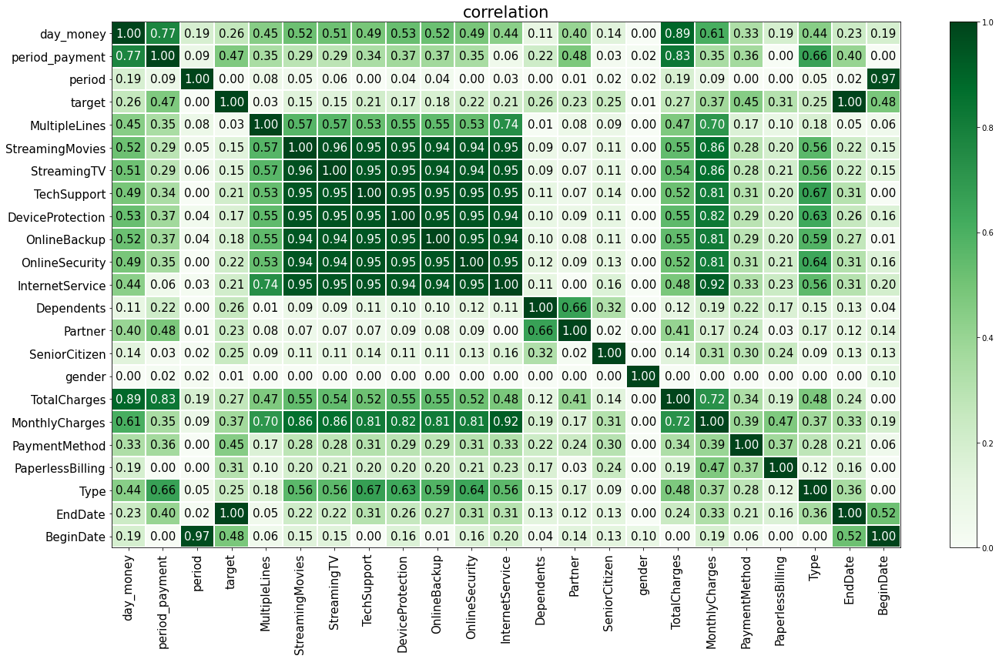

In [60]:
plot_correlation_matrix(phik_overview.values, 
                       x_labels = phik_overview.columns,
                       y_labels = phik_overview.index,
                       vmin = 0,
                       vmax = 1,
                       color_map= "Greens",
                       fontsize_factor = 1.5,
                       figsize = (20, 12))
plt.show();

Таблица корреляций показывает, что признак period получился малоинформативным, а вот period_payment & day_money как раз имеют довольно высокую корреляцию со многими другими признаками. 


Попробуем визуализировать соотношение ушедших и оставшихся клиентов для некоторых признаков. 

In [61]:
cat = []
num = []

In [62]:
for i in df.columns:
    if df[i].dtype == 'object':
        cat.append(i)
    elif df[i].dtype == 'float64':
        num.append(i)
print(cat, num)

['Type', 'PaperlessBilling', 'PaymentMethod', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'MultipleLines'] ['MonthlyCharges', 'TotalCharges', 'period', 'period_payment', 'day_money']


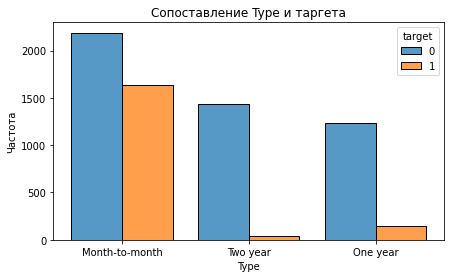

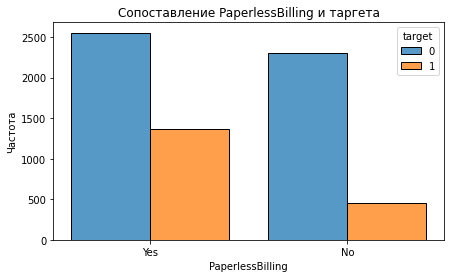

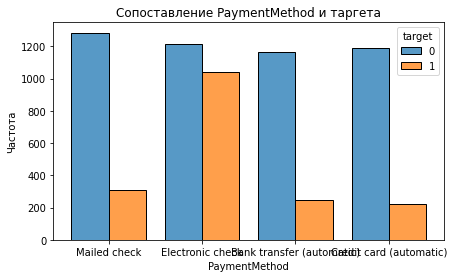

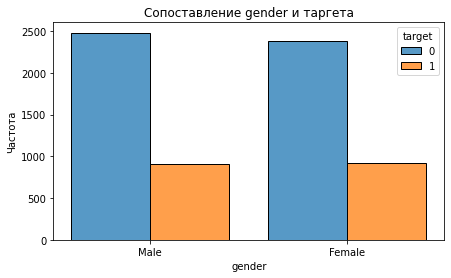

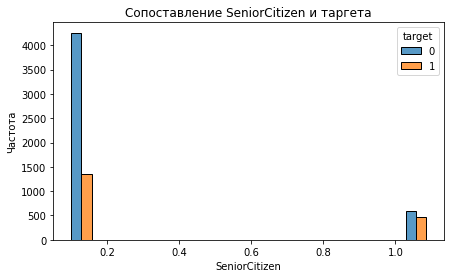

...

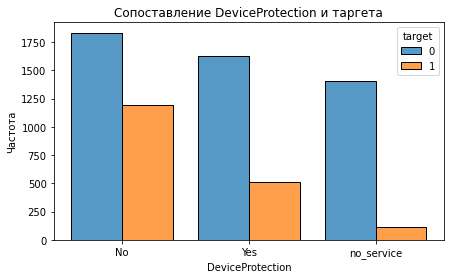

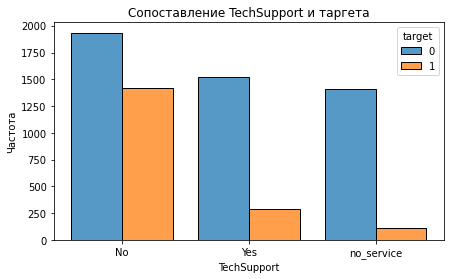

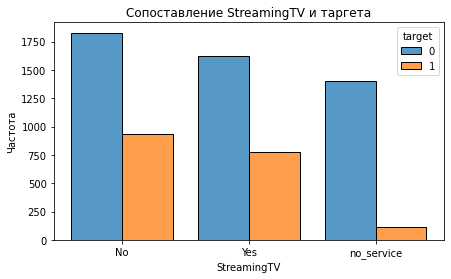

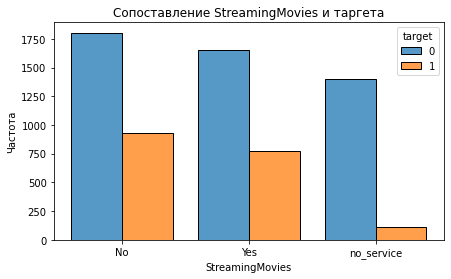

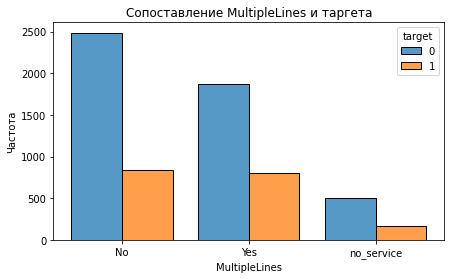

In [63]:
for i in cat:
    plt.figure(figsize=(7,4))
    sns.histplot(data=df,x=i,hue='target', multiple="dodge", shrink=0.8)
    plt.ylabel('Частота')
    plt.xlabel(i)
    plt.title(f'Сопоставление {i} и таргета')
    plt.show();

Теперь уже понятнее причина корреляции Type & target: порядка 90% (1600 из 1800) расторгнутых договоров — с помесячной оплатой. А если абонент платит на год или два вперёд, то у него меньше «искушение» этот договор расторгнуть, ведь «уже уплачено»…

PaperlessBilling: в два раза больше расторгнутых договоров среди «продвинутых» пользователей, отказавшихся от бумажных счетов. Опять-таки вопрос консервативности.
График по PaymentMethod тоже подтверждает тезис выше, более 1000 ушедших клиентов — с электронным чеком.
Чуть больше расторгнутых договоров среди холостых абонентов (опять же, у них меньше стабильности в жизни). Существенно больше — среди тех, у кого нет детей. 

По интернету: больше расторгнутых договоров у клиентов с 
- оптоволокном
- неподключенными OnlineBackup, DeviceProtection, TechSupport
По стриминговым серсивам примерно равенство, как и по MultipleLines.

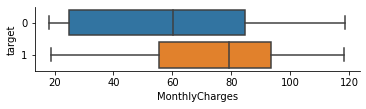

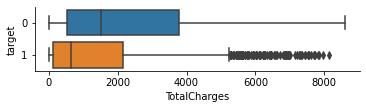

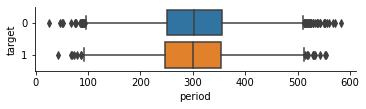

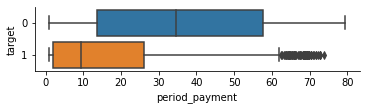

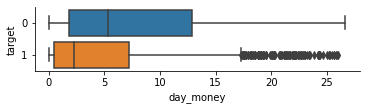

In [64]:
#Сравним показатели числовых признаков
for column in num:    
    g = sns.catplot(y='target', x=column, kind="box", data=df, orient='h')
    g.fig.set_figwidth(5)
    g.fig.set_figheight(1)
    plt.show();



У ушедших клиентов траты в месяц выше, чем у оставшихся. Однако общая сумма расходов на услуги связи выше у оставшихся клиентов (из-за того, что они дольше остаются клиентами?). Но длительность действия договора на распределении таргета не сказывается.

ВЫВОДЫ. На целевой признак влияют разные факторы. 
Но есть ряд признаков, корреляция которых с таргетом совсем низкая. Такие столбцы мы удалим перед подготовкой моделей.
Надо удалить столбцы с датами (они отражены в новых столбцах target & period). Также удалим столбец с полом абонентов (потому что корреляция нулевая) и TotalCharges (потому что высокая корреляция с MonthlyCharges, а продолжительность срока действия договора, во-первых, отражена в period, во-вторых, слабо коррелирует с целевым признаком). Наконец, очень низкая корреляция с таргетом у услуги многоканального телефонного подключения. 

In [65]:
data = df.drop(['BeginDate', 'EndDate', 'TotalCharges', 'gender', 'MultipleLines'], axis = 1)
data.head()
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6680 entries, 3668-QPYBK to 3186-AJIEK
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Type              6680 non-null   object 
 1   PaperlessBilling  6680 non-null   object 
 2   PaymentMethod     6680 non-null   object 
 3   MonthlyCharges    6680 non-null   float64
 4   SeniorCitizen     6680 non-null   object 
 5   Partner           6680 non-null   object 
 6   Dependents        6680 non-null   object 
 7   InternetService   6680 non-null   object 
 8   OnlineSecurity    6680 non-null   object 
 9   OnlineBackup      6680 non-null   object 
 10  DeviceProtection  6680 non-null   object 
 11  TechSupport       6680 non-null   object 
 12  StreamingTV       6680 non-null   object 
 13  StreamingMovies   6680 non-null   object 
 14  target            6680 non-null   int64  
 15  period            6680 non-null   float64
 16  period_payment    6680 non-null 

Подготовим признаки для обучения моделей.

In [66]:
# выделим целевую переменную

X = data.drop('target', axis=1)
y = data['target']

In [67]:
# разделим данные на выборки, сбалансируем их с помощью параметра stratify

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    stratify = data['target'],
                                                    random_state=RANDOM_STATE)

In [100]:
X_train_fimp = X_train.copy() # создадим копию тренировочной выборки с названиями колонок до векторизации для последующего их использования в анализе feature importances

In [69]:
X_train

,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,period,period_payment,day_money
customerID,,,,,,,,,,,,,,,,,
7794-JASDG,Month-to-month,Yes,Mailed check,50.75,0,No,No,DSL,Yes,No,No,No,No,No,259.0,1.000000,0.195946
1597-LHYNC,Month-to-month,Yes,Electronic check,95.00,1,No,No,Fiber optic,Yes,Yes,No,No,No,Yes,490.0,26.286316,5.096327
6661-HBGWL,Month-to-month,Yes,Bank transfer (automatic),104.75,1,No,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,329.0,41.273986,13.141185
2282-YGNOR,One year,No,Credit card (automatic),58.00,0,No,No,DSL,Yes,No,Yes,Yes,No,No,140.0,29.905172,12.389286
5480-HPRRX,Month-to-month,No,Electronic check,25.30,1,No,No,DSL,No,No,No,No,No,No,295.0,3.073123,0.263559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0247-SLUJI,Month-to-month,No,Mailed check,19.70,0,Yes,Yes,no_service,no_service,no_service,no_service,no_service,no_service,no_service,429.0,1.000000,0.045921
1891-FZYSA,Month-to-month,Yes,Electronic check,89.95,1,Yes,No,Fiber optic,No,Yes,No,No,Yes,No,423.0,68.295164,14.522813
7473-ZBDSN,Two year,No,Mailed check,18.80,0,Yes,Yes,no_service,no_service,no_service,no_service,no_service,no_service,no_service,375.0,13.593085,0.681467


In [70]:
print(f"Размер обучающей выборки: {X_train.shape}")
print(f"Размер тестовой выборки: {X_test.shape}")

Размер обучающей выборки: (5010, 17)
Размер тестовой выборки: (1670, 17)


In [71]:
y_train.describe()

count    5010.000000
mean        0.272655
std         0.445369
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: target, dtype: float64

In [72]:
y_test.describe()

count    1670.000000
mean        0.272455
std         0.445356
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: target, dtype: float64

Видим, что stratify по таргету сработал, средние значения и дисперсия в тренировочной и тестовой выборках идентичны вплоть до десятитысячных долей.

In [73]:
# категоризация и скалирование

num = ['MonthlyCharges', 
       'day_money',
       'period', 
       'period_payment']
      

cat = ['Type',
       'PaperlessBilling',
       'PaymentMethod',
       'SeniorCitizen',
       'Partner',
       'Dependents',
       'InternetService',
       'OnlineSecurity',
       'OnlineBackup',
       'DeviceProtection',
       'TechSupport',
       #'StreamingTV',
       #'StreamingMovies',
       # 'MultipleLines'
      ]    


col_transformer = ColumnTransformer(
                    transformers=[
                        ('ss', StandardScaler(), num),
                        ('ohe', OneHotEncoder(drop='first', sparse=False), cat)
                    ],
                    remainder='drop',
                    n_jobs=-1
                    )

In [74]:
X_train = col_transformer.fit_transform(X_train)
X_test = col_transformer.transform(X_test)

/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


##  Шаг 3. Обучите модель

Рассмотрим несколько классов моделей:
- решающее дерево или случайный лес,
- бустинги,
- нейронные сети.

###  Модель 1. Случайный лес

In [75]:
n_estimators = [10, 50, 100]

max_depth = [1, 10, 20]

max_features = ['auto', 'sqrt']

min_samples_split = [2, 5, 10]

min_samples_leaf = [1, 3]

rf_grid = {'n_estimators': n_estimators,
           'max_features': max_features,
           'max_depth': max_depth,
           'min_samples_split': min_samples_split,
           'min_samples_leaf': min_samples_leaf}

rf = RandomizedSearchCV(estimator = RandomForestClassifier(random_state=RANDOM_STATE), 
                   param_distributions = rf_grid, 
                   cv = 5, n_iter = 10,
                    scoring='roc_auc', n_jobs=-1, verbose=8, random_state=RANDOM_STATE, return_train_score=True)

rf.fit(X_train, y_train)
rf_score = rf.best_score_
print(rf.best_params_)
print(rf_score)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=10;, score=(train=0.919, test=0.816) total time=   0.0s
[CV 2/5] END max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=10;, score=(train=0.918, test=0.845) total time=   0.1s
[CV 3/5] END max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=10;, score=(train=0.918, test=0.832) total time=   0.0s
[CV 4/5] END max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=10;, score=(train=0.918, test=0.833) total time=   0.0s
[CV 5/5] END max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, n_estimators=10;, score=(train=0.917, test=0.822) total time=   0.0s
[CV 1/5] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=(train=0.997, test=0.814) total time=   0.

/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
25 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.9/site-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/opt/conda/lib/python3.9/site-packages/sklearn/base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "/opt/conda/lib/python3.9/site-packages/sklearn/utils/_param

{'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'max_depth': 10}
0.8349921109974503


Случайный лес дает ROC-AUC 0.83. На удивление неплохо.

###  Модель 2. Catboost

In [76]:
target_cat = data['target']
features_cat = data.drop('target', axis=1)

In [77]:
target_cat.dtype

dtype('int64')

In [78]:
features_cat.dtypes

Type                 object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
SeniorCitizen        object
Partner              object
Dependents           object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
period              float64
period_payment      float64
day_money           float64
dtype: object

In [79]:
features_train_cat, features_test_cat, target_train_cat, target_test_cat = train_test_split(
    features_cat, 
    target_cat, 
    test_size=0.25, 
    random_state=RANDOM_STATE,
    stratify = data['target']
)

In [80]:
cat_features = list(features_train_cat.select_dtypes(['category', 'object']).columns)
cat_features

['Type',
 'PaperlessBilling',
 'PaymentMethod',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies']

In [81]:
%%time

cat_data = Pool(data=features_train_cat,
          label=target_train_cat,
          cat_features=cat_features
          )

iterations = 250
eval_metric = 'AUC'
#random_seed = [int(x) for x in np.linspace(1, 100, num = 5)]
# learning_rate = 0.03
auto_class_weights = 'Balanced'
verbose = True

cat_params = {'iterations': iterations,
             'eval_metric': eval_metric,
             'auto_class_weights': auto_class_weights,
             'verbose': verbose
             }

catboost_model = CatBoostClassifier(**cat_params)
# catboost_model.fit(features_train_cat, target_train_cat, cat_features=cat_features)

grid = {'learning_rate': [0.03, 0.1],
        'depth': [6],
        'l2_leaf_reg': [3, 7]}

# grid_search_result = catboost_model.grid_search(grid, X=cat_data, verbose=5, plot=True)

cbc = GridSearchCV(
    estimator = catboost_model,
    param_grid = grid,
    scoring = 'roc_auc',
    cv=5)

cbc.fit(features_train_cat, target_train_cat, cat_features=cat_features)

0:	total: 64.7ms	remaining: 16.1s
1:	total: 76.8ms	remaining: 9.53s
2:	total: 88.2ms	remaining: 7.26s
3:	total: 98.2ms	remaining: 6.04s
4:	total: 109ms	remaining: 5.36s
5:	total: 121ms	remaining: 4.92s
6:	total: 131ms	remaining: 4.56s
7:	total: 142ms	remaining: 4.28s
8:	total: 152ms	remaining: 4.06s
9:	total: 159ms	remaining: 3.83s
10:	total: 173ms	remaining: 3.75s
11:	total: 183ms	remaining: 3.64s
12:	total: 193ms	remaining: 3.51s
13:	total: 203ms	remaining: 3.42s
14:	total: 212ms	remaining: 3.32s
15:	total: 216ms	remaining: 3.15s
16:	total: 224ms	remaining: 3.07s
17:	total: 234ms	remaining: 3.02s
18:	total: 244ms	remaining: 2.96s
19:	total: 252ms	remaining: 2.89s
20:	total: 263ms	remaining: 2.87s
21:	total: 272ms	remaining: 2.82s
22:	total: 284ms	remaining: 2.8s
23:	total: 293ms	remaining: 2.76s
24:	total: 302ms	remaining: 2.72s
25:	total: 312ms	remaining: 2.68s
26:	total: 318ms	remaining: 2.63s
27:	total: 327ms	remaining: 2.59s
28:	total: 332ms	remaining: 2.53s
29:	total: 341ms	rema

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f498fff6b80>,
             param_grid={'depth': [6], 'l2_leaf_reg': [3, 7],
                         'learning_rate': [0.03, 0.1]},
             scoring='roc_auc')

In [82]:
eval_dataset = Pool(data=features_test_cat,
                    label=target_test_cat,
                    cat_features=cat_features)

In [83]:
cb_score = cbc.best_score_
cb_score

0.84252930938409

In [84]:
cbc.best_params_

{'depth': 6, 'l2_leaf_reg': 7, 'learning_rate': 0.03}

###  Модель 3. Нейронная сеть

In [88]:
X_train_nn = torch.FloatTensor(X_train)
X_test_nn = torch.FloatTensor(X_test)
y_train_nn = torch.FloatTensor(y_train)
y_test_nn = torch.FloatTensor(y_test)

In [89]:
X_train_nn = X_train_nn.to(torch.float64)
X_test_nn = X_test_nn.to(torch.float64)
y_train_nn = y_train_nn.to(torch.float64)
y_test_nn = y_test_nn.to(torch.float64)


In [90]:
X_train_nn = X_train_nn.numpy()
X_test_nn = X_test_nn.numpy()
y_train_nn = y_train_nn.numpy()
y_test_nn = y_test_nn.numpy()

In [91]:
y_train_nn = y_train_nn.reshape(y_train.shape[0], 1)
y_test_nn = y_test_nn.reshape(y_test.shape[0], 1)

In [92]:
torch.manual_seed(76767)
np.random.seed(76767)

In [93]:
def create_model():
    model = Sequential()
    model.add(Dense(64, activation='relu', input_dim=X_train_nn.shape[1]))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer='adam', loss='binary_crossentropy')
    return model

# конвертация модели в KerasClassifier
nn_model = KerasClassifier(model=create_model, batch_size=32, verbose=2)

# определение гиперпараметров для настройки
param_grid = {'epochs': [10, 20]}  # количество эпох для тренировки

# кросс-валидация с использованием GridSearchCV
nn_grid = GridSearchCV(estimator=nn_model, param_grid=param_grid, scoring = 'roc_auc', n_jobs=1, cv=5, verbose=3)
nn_grid_result = nn_grid.fit(X_train_nn, y_train_nn)


print("Лучшая метрика на тренировочных данных: %.4f, количество эпох: %s" %
      (nn_grid_result.best_score_, nn_grid_result.best_params_['epochs']))

Fitting 5 folds for each of 2 candidates, totalling 10 fits


2023-09-29 22:24:48.241509: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/10
126/126 - 1s - loss: 0.4877 - 888ms/epoch - 7ms/step
Epoch 2/10
126/126 - 0s - loss: 0.4332 - 406ms/epoch - 3ms/step
Epoch 3/10
126/126 - 0s - loss: 0.4248 - 404ms/epoch - 3ms/step
Epoch 4/10
126/126 - 0s - loss: 0.4223 - 465ms/epoch - 4ms/step
Epoch 5/10
126/126 - 0s - loss: 0.4191 - 403ms/epoch - 3ms/step
Epoch 6/10
126/126 - 0s - loss: 0.4156 - 400ms/epoch - 3ms/step
Epoch 7/10
126/126 - 0s - loss: 0.4122 - 404ms/epoch - 3ms/step
Epoch 8/10
126/126 - 0s - loss: 0.4098 - 405ms/epoch - 3ms/step
Epoch 9/10
126/126 - 0s - loss: 0.4078 - 409ms/epoch - 3ms/step
Epoch 10/10
126/126 - 0s - loss: 0.4033 - 401ms/epoch - 3ms/step
32/32 - 0s - 107ms/epoch - 3ms/step
[CV 1/5] END .........................epochs=10;, score=0.816 total time=   5.1s
Epoch 1/10
126/126 - 1s - loss: 0.5218 - 878ms/epoch - 7ms/step
Epoch 2/10
126/126 - 0s - loss: 0.4463 - 409ms/epoch - 3ms/step
Epoch 3/10
126/126 - 0s - loss: 0.4357 - 406ms/epoch - 3ms/step
Epoch 4/10
126/126 - 0s - loss: 0.4319 - 406ms/epo

In [94]:
cols = ['model', 'best_roc_auc_score']
model_data = [['RandomForest', rf_score],
             ['Catboost', cb_score],
             ['NeuralNetwork', nn_grid_result.best_score_]]
model_comparison = pd.DataFrame(data= model_data, columns = cols)
model_comparison

,model,best_roc_auc_score
0,RandomForest,0.834992
1,Catboost,0.842529
2,NeuralNetwork,0.832886


Итак, после тренировки и сравнения трёх моделей на кросс-валидации best_score_ лучше всех показал себя Катбуст, затем RandomForest, наконец, нейронная сеть. Можем переходить к тестированию.

## Шаг 4. Тестирование модели.

Тестируем катбуст.

In [95]:
cb_pred = cbc.predict(features_test_cat)

In [96]:
cb_score = roc_auc_score(target_test_cat, cbc.predict_proba(features_test_cat)[:, 1])
print(f"ROC-AUC модели на тестовом наборе данных: {cb_score:.4f}")

ROC-AUC модели на тестовом наборе данных: 0.8567


Ура, необходимая метрика достигнута

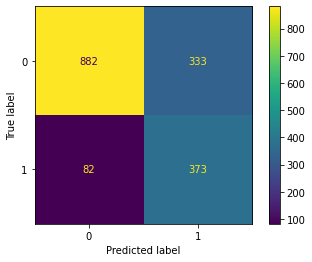

In [97]:
conf_matrix = confusion_matrix(y_test, cb_pred) 
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix,
                            display_labels=rf.classes_)
disp.plot()
plt.show()

Из confusion matrix видим, что модель дает 373 ответа типа TR (true positive) и 882 ответа TN (true negative). Отметим, что количество непредсказанных уходов абонентов (82) существенно ниже неверно предсказанных уходов (333). Но в целом результаты можно признать удовлетворительными.

##  Анализ важности признаков.

In [98]:
X_train_fimp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5010 entries, 7794-JASDG to 4274-DRSQT
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Type              5010 non-null   object 
 1   PaperlessBilling  5010 non-null   object 
 2   PaymentMethod     5010 non-null   object 
 3   MonthlyCharges    5010 non-null   float64
 4   SeniorCitizen     5010 non-null   object 
 5   Partner           5010 non-null   object 
 6   Dependents        5010 non-null   object 
 7   InternetService   5010 non-null   object 
 8   OnlineSecurity    5010 non-null   object 
 9   OnlineBackup      5010 non-null   object 
 10  DeviceProtection  5010 non-null   object 
 11  TechSupport       5010 non-null   object 
 12  StreamingTV       5010 non-null   object 
 13  StreamingMovies   5010 non-null   object 
 14  period            5010 non-null   float64
 15  period_payment    5010 non-null   float64
 16  day_money         5010 non-null 

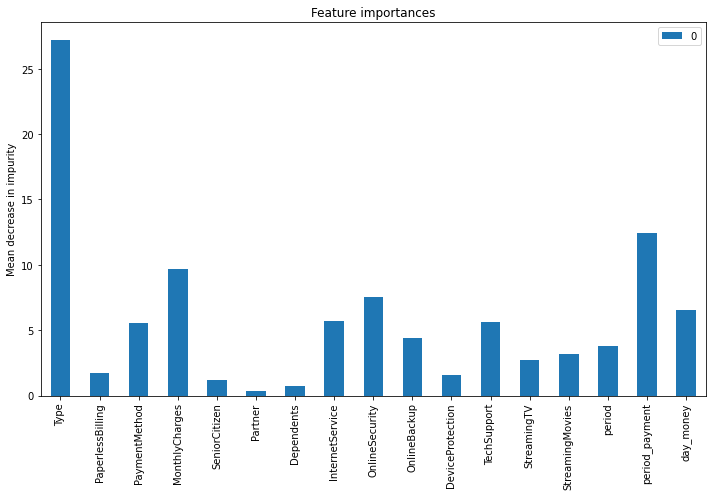

In [99]:
importances = pd.DataFrame(cbc.best_estimator_.feature_importances_, X_train_fimp.columns)
importances

std = np.std([cbc.best_estimator_.feature_importances_ for tree in str(1000)], axis=0)

fig, ax = plt.subplots(figsize=(10,7))
importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

Анализ feature importances показывает, что ключевым фактором, определяющим риск разрыва клиентского договора, является тип оплаты. Мы ещё ранее, на этапе EDA, видели, что клиенты с помесячной оплатой гораздо чаще отказываются от услуг компании. Им в первую очередь следует рассылать спецпредложения и скидки. Следующие важные факторы: ежемесячный платеж и созданный нами period_payment. 

Удивительно, но очень низкое влияние у таких факторов, как семейное положение и наличие детей. На этапе EDA мы видели более значительную корреляцию с распределением целевого признака.

## Выводы

Модель CatboostClassifier с параметрами
{'depth': 6, 'l2_leaf_reg': 7, 'learning_rate': 0.03}
решает задачу заказчика и позволяет предсказывать отток клиентов. Метрика ROC-AUC на тестовой выборке превышает планку в 0,856.

Модель может быть улучшена при помощи ещё более детального EDA и выявления существенных факторов, влияющих на разрыв договора.

Анализ feature importances показал, что компании в первую очередь стоит обратить внимание на клиентов, пользующихся помесячной оплатой услуг интернета и стриминговых платформ — именно они чаще всего прекращают действие договоров.